# Data Mining Assignment 2

# Introduction


### Contextualizing the Problem

Data mining is an essential practice for uncovering patterns and insights from large datasets, enabling businesses to make data-driven decisions. This approach is valuable in marketing, where understanding customer behavior can lead to more targeted campaigns and optimized resource allocation.

In 2023, successful marketing campaigns' median profit-based return on investment (ROI) worldwide reached 2.43 U.S. dollars, meaning global advertisers profited, on average, 2.43 dollars for every dollar they spent on those strategies (Statista, 2024). This highlights the key role played by marketing campaigns in increasing the profitability of an orgnisation.

This project focuses to apply data mining techniques to the marketing domain, specifically focusing on a dataset provided by a food delivery company that offers various product categories through multple sales channels. The dataset is derived from Kaggle repository. It includes the demographic data gathered from 2,240 customers who were randomly selected to promote a product, the results recorded as customer responses (purchases or non-purchases) for five marketing campaigns conducted by a company, the amount spent on multiple product categories and the sales channel used to make the purchase.

Despite generating revenue from respondents, the overall campaign ran at a loss. So, our project forcuses on analysing how to make the next hypothetical promotion a success by filtering the targeting audience. 

### Problem Statement

This project aims to tackle three interrelated challenges using a combination of data mining techniques: classification, clustering, and association rule mining.

**Classification:** Given the data from a sample marketing campaign, how can we accurately predict which customers are most likely to respond to future campaigns?

**Clustering Analyis:** What are the distinct customer segments based on their demographic information, purchasing behavior, and campaign response?

**Association Analysis:** Are there associations between certain demographic features (e.g., marital status, number of children) and purchasing preferences?

### Business Understanding
<div style="text-align: center;">
    <img src="https://i.imgur.com/f7IWMak.jpeg" alt="Flow Diagram" style="width:720px;height:200px;">
</div>

The main goal is to build a robust predictive model that can identify customers most likely to respond to future campaigns. This will enable the marketing team to strategically target high-potential customers, enhancing campaign efficiency and profitability. Achieving this goal involves understanding the characteristics of past respondents and using this insight to refine future efforts. The success of this initiative is expected to justify the value of data-driven marketing strategies and contribute to sustained revenue growth.

Key business objectives include:

- Increasing Campaign Profitability: By accurately predicting respondents, the company can focus its marketing efforts on customers who are more likely to engage, minimizing costs and maximizing revenue.

- Customer Insight and Segmentation: Gaining a deeper understanding of customer behaviors and attributes that correlate with positive responses to marketing campaigns.

- Strategic Resource Allocation: Enabling the marketing team to allocate budget and resources more effectively.

### Data Mining Methodology: CRISP-DM Approach

To ensure a systematic and effective analysis, we will adopt the CRISP-DM (Cross-Industry Standard Process for Data Mining) framework. This method structures the project into six key phases:
<div style="text-align: center;">
    <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b9/CRISP-DM_Process_Diagram.png/639px-CRISP-DM_Process_Diagram.png" alt="CRISP-DM Process" style="width:400px;height:400px;margin-top: 20px;">
</div>

1. Business Understanding: The project’s goals and success criteria will be defined here, which will be focused on predicting customer responses and maximizing campaign profit. The aim is to shortlist the target audience who are more likely to participte in an upcoming campaign that improves the return on investment (ROI).

2.  Data Understanding: This step invloves exploring the dataset (by checking for outliers, correlations etc.) to identify the quality of data. The dataset is obtained from Kaggle repository which contains 2,240 observations with 29 features. The dataset includes socio-demographic, response and camapaign participation data of customers who were randomly selected to participate in campaigns conducted to promote a product.

3.  Data Preparation: This is a pivotal phase in which we prepare the dataset for modeling by handling missing values, outliers, and multicolinearity. Also tranformation of data will be done in this phase by applyling advanced feature engineering techniques like scaling, standardization or normalization, etc. which will also enhance the model's performance.

4.  Modeling: Since this is a classification problem multiple predictive models such as random forest, artificial neural network, gradient boosting and logistic regression are employed. The dataset will be divided into 2 parts namely training and testing set. The modelling techniques will be applied on the training set. Then, we apply hyperparameter tuning using gridsearch and run the models again using the best parameters.

5.  Evaluation: In this step, all the models will be assessed based on the success criteria discussed in business objective i.e. to have a high `F1-score`. However, since we would not want to be dependent only on one metric, we also consider other metrics like `accuracy` and ROC curve, for example. The models will be compared against each other in terms of these metrics and the best model which satisfies both the data mining and business goals will be finalised.

6.  Deployment: This step is omitted.


# ABOVE TEXT IS GOAT GENERATED WE NEED TO READ THROUGH IT AND MAKE SURE IT IS GOOD !!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

### Importing modules

In [4]:
import os
import datetime
import warnings
import inflection
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import (accuracy_score, precision_score, recall_score, f1_score, 
                             roc_auc_score, confusion_matrix, classification_report, 
                             silhouette_score)
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasClassifier
from mlxtend.frequent_patterns import fpgrowth, association_rules
from scipy.cluster.hierarchy import linkage, dendrogram, cut_tree

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

DATA_YEAR = datetime.datetime(year=2015, month=1, day=1)


### Data Understanding

`todo:` Discuss potential challenges, limitations, and propose
solutions related to data quality, computational complexity, and data
mining techniques, and discuss approaches of how to tackle and
address them through your approach.

In [5]:
# First create the folder "data" and add the data source into it
def check_data_folder_dataset_load_df(dataset_csv_name="marketing_campaign.csv"):
    if not os.path.isdir("data"):
        raise Exception("there is no data folder ")
    if not os.path.exists(f"data/{dataset_csv_name}"):
        raise Exception(f"there is no {dataset_csv_name} in the data folder ")
    
    return pd.read_csv(f"data/{dataset_csv_name}", delimiter=";")
    
df = check_data_folder_dataset_load_df()
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


The dataset contains 29 columns and 2240 rows. The column descriptions can be found below:

1. ID - Customer’s id
2. Year_Birth - Customer’s year of birth
3. Education - Customer’s level of education
4. Marital_Status - Customer’s marital status
5. Income - Customer’s yearly household income
6. Kidhome - Number of small children in customer’s household
7. Teenhome - Number of teenagers in customer’s household
8. Dt_Customer - Date of customer’s enrolment with the company
9. Recency - Number of days since the last purchase
10. MntWines - Amount spent on wine products in the last 2 years
11. MntFruits - Amount spent on fruits products in the last 2 years
12. MntMeatProducts - Amount spent on meat products in the last 2 years
13. MntFishProducts - Amount spent on fish products in the last 2 years
14. MntSweetProducts - Amount spent on sweet products in the last 2 years
15. MntGoldProds - Amount spent on gold products in the last 2 years
16. NumDealsPurchases - Number of purchases made with discount
17. NumWebPurchases - Number of purchases made through company’s web site
18. NumCatalogPurchases - Number of purchases made using catalogue
19. NumStorePurchases - Number of purchases made directly in stores
20. NumWebVisitsMonth - Number of visits to company’s web site in the last month
21. AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
22. AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise
23. AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise
24. AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise
25. AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
26. Complain - 1 if customer complained in the last 2 years, 0 otherwise
27. Z_CostContact - Cost to contact a customer
28. Z_Revenue - Revenue after client accepting campaign
29. Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise

We can look at the descriptive statistics of the dataframe below:

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

From this we can see that `Education`, `Marital_Status` and `Dt_customer` are non numeric values.

Now we can take a look at the descriptive statistics of the numerical values:

In [7]:
df.describe().transpose().round(2)

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.16,3246.66,0.0,2828.25,5458.5,8427.75,11191.0
Year_Birth,2240.0,1968.81,11.98,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2216.0,52247.25,25173.08,1730.0,35303.00,51381.5,68522.00,666666.0
Kidhome,2240.0,0.44,0.54,0.0,0.00,0.0,1.00,2.0
Teenhome,2240.0,0.51,0.54,0.0,0.00,0.0,1.00,2.0
Recency,2240.0,49.11,28.96,0.0,24.00,49.0,74.00,99.0
MntWines,2240.0,303.94,336.60,0.0,23.75,173.5,504.25,1493.0
MntFruits,2240.0,26.30,39.77,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2240.0,166.95,225.72,0.0,16.00,67.0,232.00,1725.0
MntFishProducts,2240.0,37.53,54.63,0.0,3.00,12.0,50.00,259.0


We can check for missing values in the dataset:

In [8]:
print("Missing data in the dataframe:")
print(df.isnull().sum())

Missing data in the dataframe:
ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64


Since 1% of the columns have Null values in them, we can safely remove them:

In [9]:
df = df.dropna()

Now, for consistency sake we transform all column names into camelcase

In [10]:
df.columns = [inflection.underscore(col) for col in df.columns]
df.columns

Index(['id', 'year_birth', 'education', 'marital_status', 'income', 'kidhome',
       'teenhome', 'dt_customer', 'recency', 'mnt_wines', 'mnt_fruits',
       'mnt_meat_products', 'mnt_fish_products', 'mnt_sweet_products',
       'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases',
       'num_catalog_purchases', 'num_store_purchases', 'num_web_visits_month',
       'accepted_cmp3', 'accepted_cmp4', 'accepted_cmp5', 'accepted_cmp1',
       'accepted_cmp2', 'complain', 'z_cost_contact', 'z_revenue', 'response'],
      dtype='object')

We can also check for the amount of unique values per column in our dataset, to see if maybe some data is redundant:

In [11]:
df.nunique()

id                       2216
year_birth                 59
education                   5
marital_status              8
income                   1974
kidhome                     3
teenhome                    3
dt_customer               662
recency                   100
mnt_wines                 776
mnt_fruits                158
mnt_meat_products         554
mnt_fish_products         182
mnt_sweet_products        176
mnt_gold_prods            212
num_deals_purchases        15
num_web_purchases          15
num_catalog_purchases      14
num_store_purchases        14
num_web_visits_month       16
accepted_cmp3               2
accepted_cmp4               2
accepted_cmp5               2
accepted_cmp1               2
accepted_cmp2               2
complain                    2
z_cost_contact              1
z_revenue                   1
response                    2
dtype: int64

From above we acn see `z_cost_contact` and `z_revenue` columns have only one value, as such we can drop those columns

In [12]:
df = df.drop(columns=['z_cost_contact', 'z_revenue'])

### Pairplot

In [13]:
# Selects response and continuous numeric columns with >3 unique values (e.g., excludes discrete variables like 'kidhome', 'teenhome'), ignoring 'id'
numerical_features = [col for col in df if col == 'response' or (df[col].dtype.kind in 'fi' and df[col].nunique() > 3) and col != 'id']

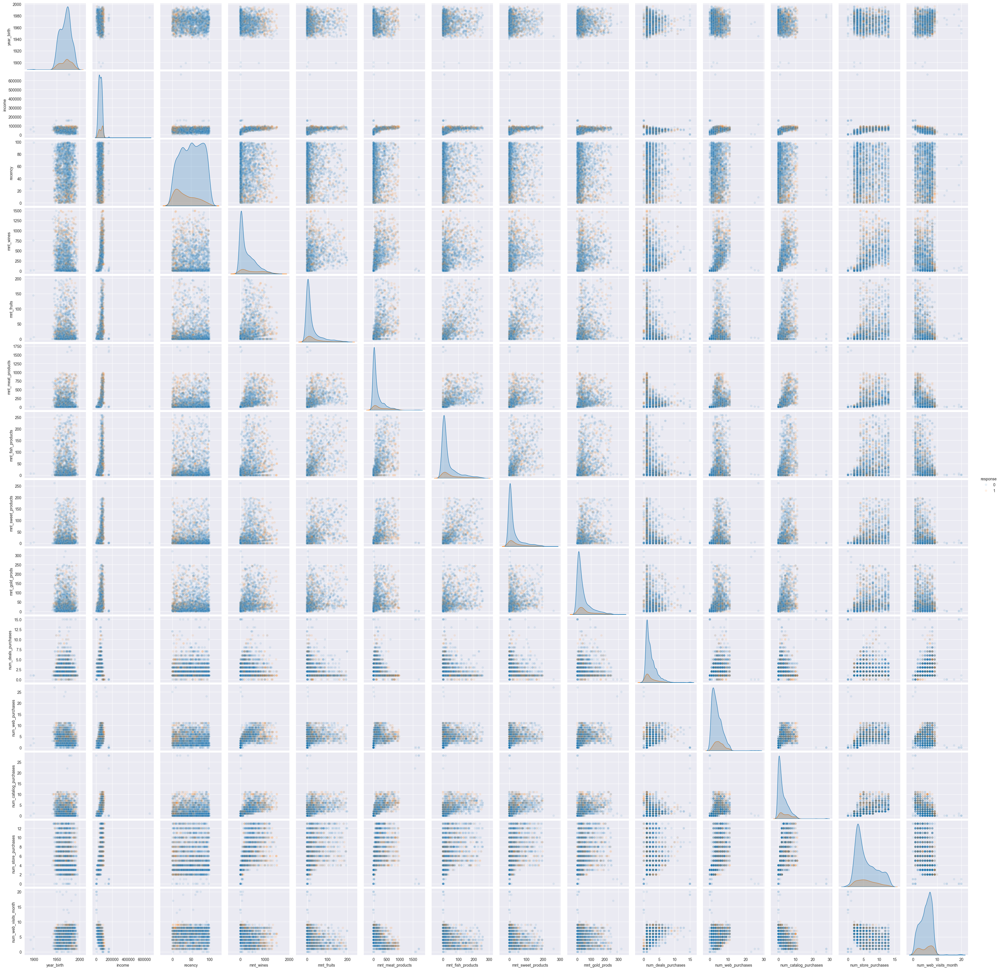

In [14]:
# Numerical Pairplot according to response variable
sns.pairplot(df[numerical_features], hue='response', plot_kws={'alpha':0.1})
plt.show()

`todo:` explain what is seen above

A lot of the distributions are right skewed, therefore we will apply log scaling at a later step.

### Histogram

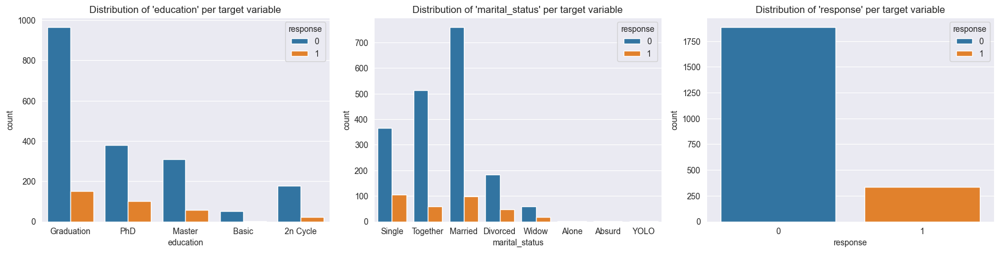

In [15]:
def create_histograms(df, columns, rows=1, cols=2):
    fig, axes = plt.subplots(rows, cols, figsize=(17, 8))
    axes = axes.flatten()  # Flatten to easily index in a loop

    for i, column in enumerate(columns):
        sns.countplot(data=df, x=column, hue='response', ax=axes[i])
        axes[i].set_title(f"Distribution of '{column}' per target variable")

    # Remove any empty subplots if there are fewer columns than grid spaces
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Example usage
df_categorical_variables = df[['education', 'marital_status', 'response']]
create_histograms(df_categorical_variables, df_categorical_variables.columns, rows=2, cols=3)

`todo:` explain

### Checking Outliers

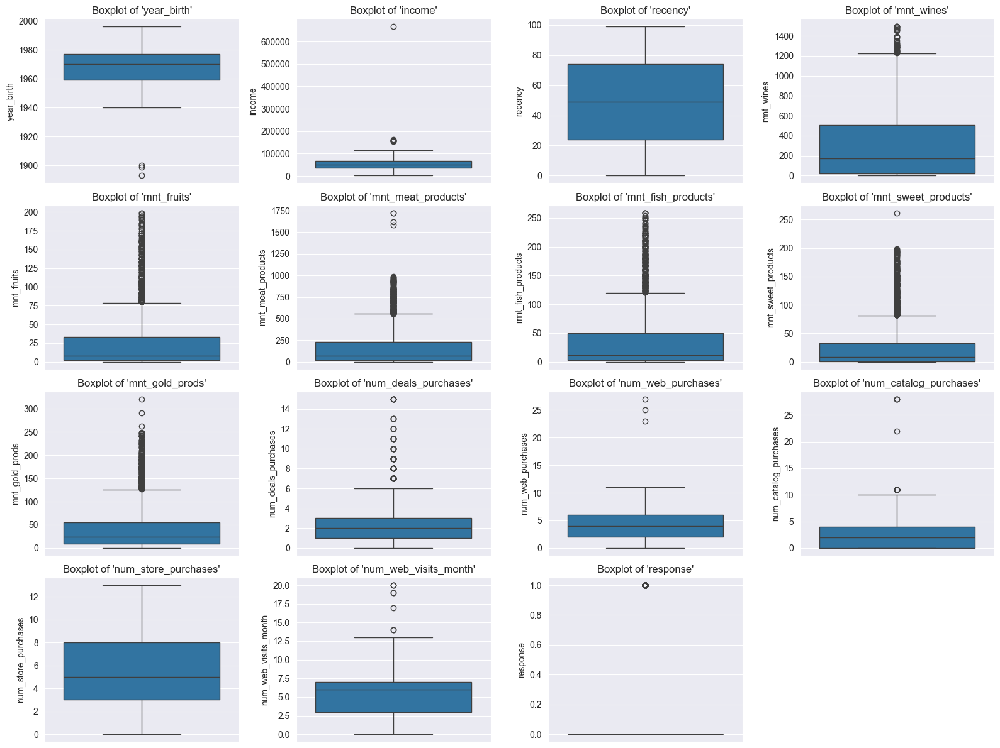

In [16]:
def create_boxplots(df, columns, rows=2, cols=2):
    fig, axes = plt.subplots(rows, cols, figsize=(rows*4, cols*3))
    axes = axes.flatten()  # Flatten to easily index in a loop

    for i, column in enumerate(columns):
        sns.boxplot(data=df, y=column, ax=axes[i])
        axes[i].set_title(f"Boxplot of '{column}'")

    # Remove any empty subplots if there are fewer columns than grid spaces
    for j in range(i + 1, rows * cols):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

create_boxplots(df, numerical_features, rows=4, cols=4)

Looking at age and income, we can see age seems to be some data input limits. For income we also have some outliers that we could look at removing to let the models generalise better.

`todo:` motivate why we dont remove outliers from other classes

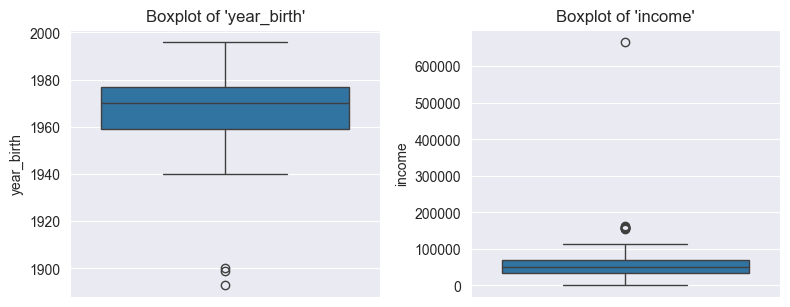

In [17]:
create_boxplots(df, ['year_birth', 'income'])

# Removing outliers
We would like to remove extremely poor or extremely rich customers from the data. 
Also we would like to remove extremely old and young people from the data. These would not help to give representable results downstream

In [18]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define the lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the dataframe to only include values within the bounds
    df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]
    return df

print("Number of rows before removing outliers:", df.shape[0])
df = remove_outliers(df, 'income')
df = remove_outliers(df, 'year_birth')
print("Number of rows after removing outliers:", df.shape[0])

Number of rows before removing outliers: 2216
Number of rows after removing outliers: 2205


### Feature Engineering

Lets add some extra information based on the dataset. 

In [19]:
df

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


### Add the column months as customer
How many months a customer has been a customer is represented by the months_as_customer columns

In [20]:
# Add a new column age to the dataset
df['age'] = DATA_YEAR.year - df['year_birth']

df['dt_customer'] = pd.to_datetime(df['dt_customer'], format='%Y-%m-%d')
df['months_as_customer'] = 0
for index, row in df.iterrows():
   months_as_customer = round((DATA_YEAR - row['dt_customer']).days/30)
   df.at[index, "months_as_customer"] = months_as_customer

In [21]:
# Add a new column to calculate the total amount spent by each customer for every product
df['total_spend'] = df['mnt_wines'] + df['mnt_fruits'] + df['mnt_meat_products'] + df['mnt_fish_products'] + df['mnt_sweet_products'] + df['mnt_gold_prods']

# Add a new column to calculate the total purchases made by each customer
df['total_purchases'] = df['num_deals_purchases'] + df['num_web_purchases'] + df['num_catalog_purchases'] + df['num_store_purchases']

# Add a new column to calculate the total number of campaign responses made by each customer
df['total_accepted_cpm'] = df['accepted_cmp1'] + df['accepted_cmp2'] + df['accepted_cmp3'] + df['accepted_cmp4'] + df['accepted_cmp5']

# Add a new column to check if the customer is a parent or not as a boolean
df['is_parent'] = ((df['kidhome'] > 0) | (df['teenhome'] > 0)).astype(int)

# Add a new column to split the marital status 
couple_status_mapping = {
    'Married': 1,
    'Together': 1,
    'Single': 0,
    'Divorced': 0,
    'Widow': 0,
    'Alone': 0,
    'Absurd': 0,
    'YOLO': 0
}
df['is_couple'] = df['marital_status'].map(couple_status_mapping)

# Create dummy variables for the 'education' column
education_dummies = pd.get_dummies(df['education'].str.lower(), prefix='education', dtype=int, drop_first=True)
df = pd.concat([df, education_dummies], axis=1)

df.head()

,id,year_birth,education,marital_status,income,kidhome,teenhome,dt_customer,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,58,28,1617,25,0,0,0,0,1,0,0
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,61,10,27,6,0,1,0,0,1,0,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,50,17,776,21,0,0,1,0,1,0,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,31,11,53,8,0,1,1,0,1,0,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,34,12,422,19,0,1,1,0,0,0,1


Below we can now drop the redundant features because we transformed these variables into new variables:

In [22]:
df = df.drop(columns=['id', 'education', 'marital_status', 'year_birth', 'dt_customer'])

Now, checking the correlation:

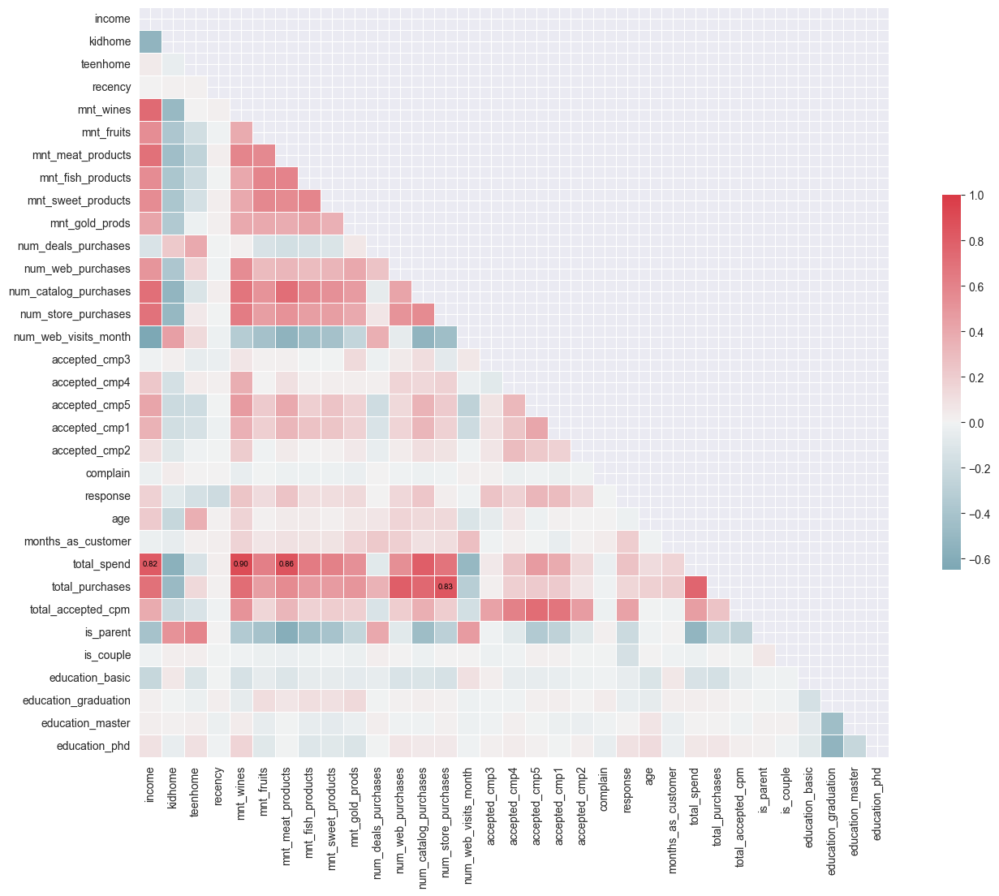

In [23]:
# Calculate corr
corr = df.corr()
# Mask for upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# Set up the matplotlib figure
plt.figure(figsize=(17, 12))

# Create an annotation matrix with conditions for values above 0.8 or below -0.8
annot = corr.applymap(lambda x: f"{x:.2f}" if abs(x) >= 0.8 else "")

# Draw the heatmap with the mask, annotations, and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=sns.diverging_palette(220, 10, as_cmap=True), vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=annot, fmt="", annot_kws={"size": 7, "color": "black"})

plt.show()

`todo:` Resolve highly correlated variables found above

We can look at our target variable standalone.

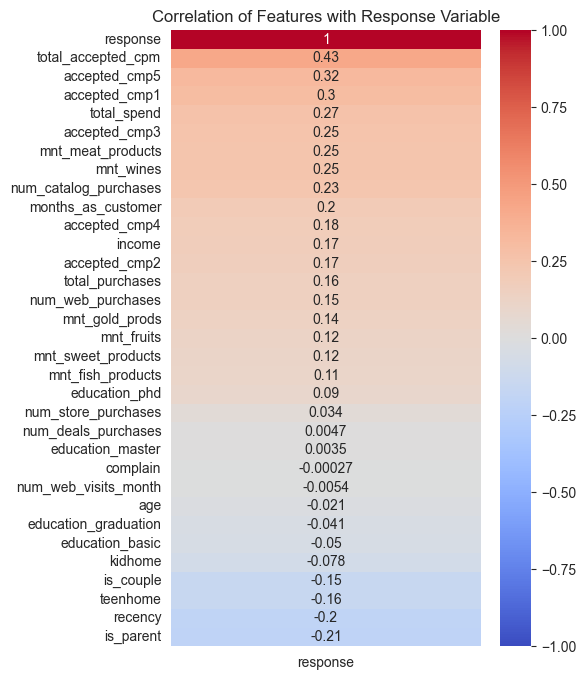

In [24]:
plt.figure(figsize=(5, 8))
sns.heatmap(corr[['response']].sort_values(by='response', ascending=False), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation of Features with Response Variable')
plt.show()

`todo:` Interpret

### Normalization and scaling step 

In [25]:
# Update to the numerical features
numerical_features = ['income', 'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 
                               'mnt_sweet_products', 'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases', 
                               'num_catalog_purchases', 'num_store_purchases', 'num_web_visits_month', 'age', 
                               'months_as_customer', 'total_spend', 'total_purchases']

# Apply log transformation to specified features (that are right-skewed)
log_features = ['income', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 
                'mnt_sweet_products', 'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases', 
                'num_catalog_purchases', 'total_spend']

# Get the numerical features that are not in the log_features list
numerical_features_no_log = [feature for feature in numerical_features if feature not in log_features]

# Apply the log transformation
df[log_features] = df[log_features].apply(lambda x: np.log1p(x))

# Initialise the scaler
scaler = MinMaxScaler()

# Apply the scaler to the numerical features
df_normalized = df.copy()
# Apply the scaler to the numerical features that were not log-transformed
df_normalized[numerical_features_no_log] = scaler.fit_transform(df[numerical_features_no_log])
df_normalized.head()

,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd
0,10.970592,0,0,0.585859,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,2.197225,2.397895,0.307692,0.35,0,0,0,0,0,0,1,0.696429,0.916667,7.388946,0.581395,0,0,0,0,1,0,0
1,10.743869,1,1,0.383838,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,0.693147,0.693147,0.153846,0.25,0,0,0,0,0,0,0,0.750000,0.166667,3.332205,0.139535,0,1,0,0,1,0,0
2,11.179046,0,0,0.262626,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,2.197225,1.098612,0.769231,0.20,0,0,0,0,0,0,0,0.553571,0.458333,6.655440,0.488372,0,0,1,0,1,0,0
3,10.190432,1,0,0.262626,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,1.098612,0.000000,0.307692,0.30,0,0,0,0,0,0,0,0.214286,0.208333,3.988984,0.186047,0,1,1,0,1,0,0
4,10.973254,1,0,0.949495,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,1.791759,1.386294,0.461538,0.25,0,0,0,0,0,0,0,0.267857,0.250000,6.047372,0.441860,0,1,1,0,0,0,1


##  Clustering and Association rules mining

### K-Means Clustering

In the context of k-means, inertia is the sum of squared distances of samples to their closest cluster center (also known as centroid).

We can use the inertia values to determine the optimal number of clusters by identifying the elbow point in the inertia plot. The elbow point represents the optimal number of clusters where the inertia starts to decrease at a slower rate.

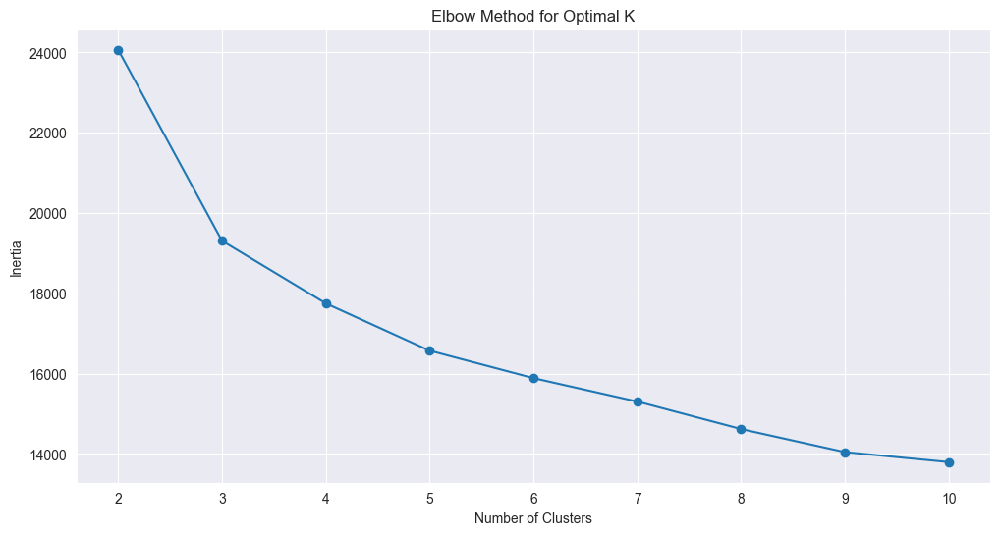

In [26]:
def compute_inertia_values(dataframe, cluster_range):
    inertias = []
    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(dataframe)
        inertias.append(kmeans.inertia_)
    return inertias

def plot_elbow_method(cluster_range, inertias):
    plt.figure(figsize=(12, 6))
    plt.plot(cluster_range, inertias, marker='o')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')
    plt.title('Elbow Method for Optimal K')
    plt.show()


df_cluster = df_normalized.copy()
df_cluster = df_cluster.drop(columns=['response'])
cluster_range = range(2, 11)
km_inertia = compute_inertia_values(df_cluster, cluster_range)   
plot_elbow_method(cluster_range, km_inertia)

Based on the elbow plot we built, the number of clusters that inverts the diminishing returns of the inertia is a toss up between 4 and 5. Despite the subtle difference, we ended up choosing the option that, looking at the density plots later on, seemed to better represent the different customer segments. 

Moreover, the silhouette score does support the choice of 5 over 4, as the generated array is higher for the former.

In [90]:
def kmeans_clustering(dataframe, n):
    
    kmeans_arr = []
    silhouette_arr = []
    for n in list(range(2, n+1)):
        kmeans = KMeans(n_clusters=n, random_state = 0)
        km_clusters = kmeans.fit_predict(dataframe)
        kmeans_arr.append(km_clusters)
        silhouette_arr.append(silhouette_score(dataframe, km_clusters))
    
    # Adding the k-means cluster labels to the dataframe
    dataframe['kmeans_cluster'] = kmeans_arr[-1]

    return dataframe, kmeans_arr, silhouette_arr

km_df, km_results, sil_scores = kmeans_clustering(df_cluster, 5)
print("Silhouette Scores", [float(num) for num in sil_scores], "\n")
km_df.head(10)

Silhouette Scores [0.3850667512276938, 0.2870715946251413, 0.29163220384596267, 0.24024129879818432] 



,income,kidhome,teenhome,recency,mnt_wines,mnt_fruits,mnt_meat_products,mnt_fish_products,mnt_sweet_products,mnt_gold_prods,num_deals_purchases,num_web_purchases,num_catalog_purchases,num_store_purchases,num_web_visits_month,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,age,months_as_customer,total_spend,total_purchases,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,kmeans_cluster
0,10.970592,0,0,0.585859,6.455199,4.488636,6.304449,5.153292,4.488636,4.488636,1.386294,2.197225,2.397895,0.307692,0.35,0,0,0,0,0,0,0.696429,0.916667,7.388946,0.581395,0,0,0,0,1,0,0,1
1,10.743869,1,1,0.383838,2.484907,0.693147,1.945910,1.098612,0.693147,1.945910,1.098612,0.693147,0.693147,0.153846,0.25,0,0,0,0,0,0,0.750000,0.166667,3.332205,0.139535,0,1,0,0,1,0,0,2
2,11.179046,0,0,0.262626,6.056784,3.912023,4.852030,4.718499,3.091042,3.761200,0.693147,2.197225,1.098612,0.769231,0.20,0,0,0,0,0,0,0.553571,0.458333,6.655440,0.488372,0,0,1,0,1,0,0,1
3,10.190432,1,0,0.262626,2.484907,1.609438,3.044522,2.397895,1.386294,1.791759,1.098612,1.098612,0.000000,0.307692,0.30,0,0,0,0,0,0,0.214286,0.208333,3.988984,0.186047,0,1,1,0,1,0,0,4
4,10.973254,1,0,0.949495,5.159055,3.784190,4.779123,3.850148,3.332205,2.772589,1.791759,1.791759,1.386294,0.461538,0.25,0,0,0,0,0,0,0.267857,0.250000,6.047372,0.441860,0,1,1,0,0,0,1,3
5,11.043146,0,1,0.161616,6.255750,3.761200,4.595120,0.000000,3.761200,2.708050,1.098612,1.945910,1.609438,0.769231,0.30,0,0,0,0,0,0,0.517857,0.416667,6.575076,0.511628,0,1,1,0,0,1,0,3
6,10.926586,0,1,0.343434,5.463832,4.189655,5.105945,3.931826,3.912023,3.332205,1.609438,2.079442,1.386294,0.538462,0.30,0,0,0,0,0,0,0.446429,0.833333,6.381816,0.488372,0,1,0,0,1,0,0,1
7,10.417957,1,0,0.323232,4.343805,2.397895,4.043051,1.386294,0.693147,3.178054,1.098612,1.609438,0.000000,0.307692,0.40,0,0,0,0,0,0,0.196429,0.583333,5.135798,0.232558,0,1,1,0,0,0,1,0
8,10.320618,1,0,0.191919,2.708050,0.000000,3.218876,1.386294,1.386294,1.098612,0.693147,1.386294,0.000000,0.153846,0.45,0,0,0,0,0,0,0.392857,0.541667,3.850148,0.139535,0,1,1,0,0,0,1,2
9,8.639234,1,1,0.686869,3.367296,0.000000,1.945910,0.693147,0.693147,2.639057,0.693147,0.693147,0.000000,0.000000,1.00,1,0,0,0,0,0,0.821429,0.166667,3.912023,0.046512,1,1,1,0,0,0,1,2


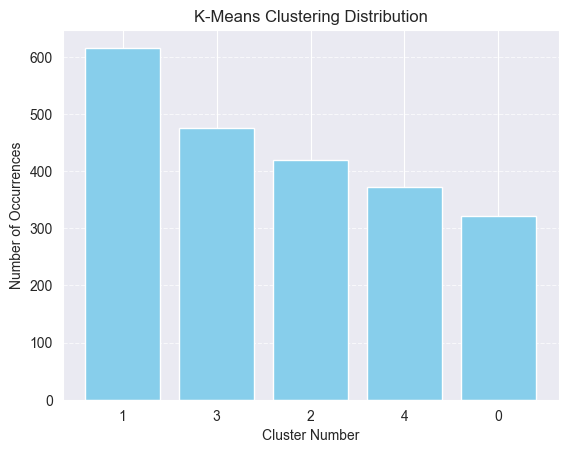

In [91]:
# Plotting K-Means clustering density plot
def plot_cluster_distribution(dataframe, column1, title1, xlab1):
    
    cluster_counts = dataframe[column1].value_counts()

    plt.bar(cluster_counts.index.astype(str), cluster_counts.values, color='skyblue')
    plt.title(title1)
    plt.xlabel(xlab1)
    plt.ylabel('Number of Occurrences')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
    
plot_cluster_distribution(km_df, 'kmeans_cluster', 'K-Means Clustering Distribution', 'Cluster Number')

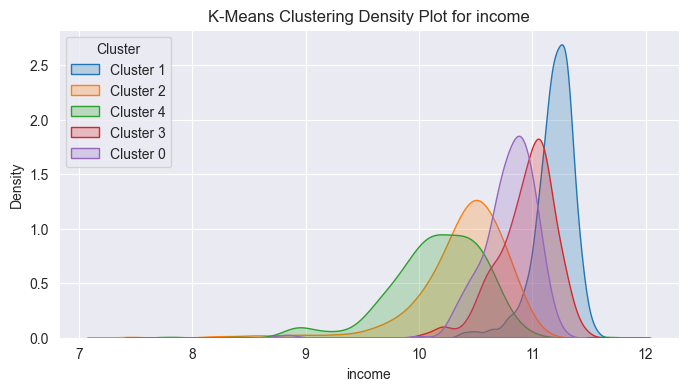

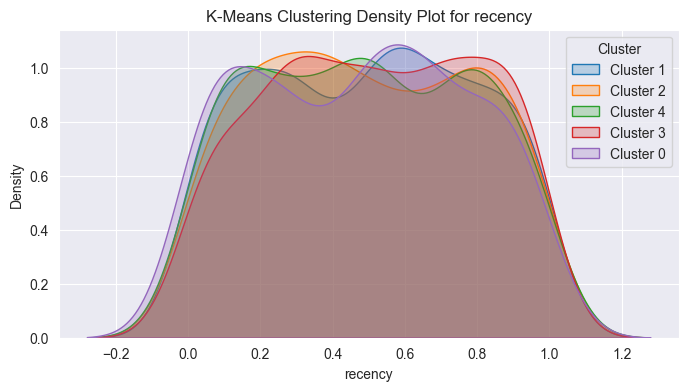

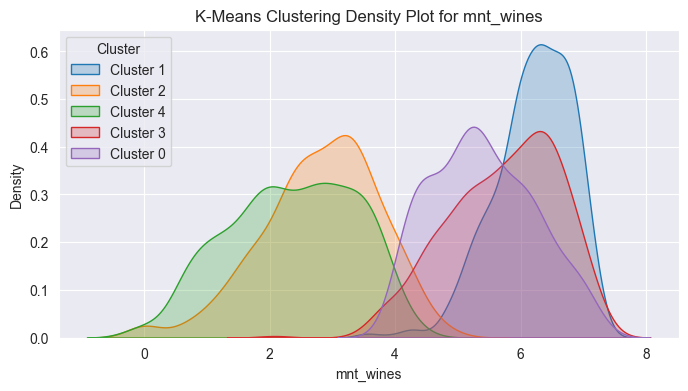

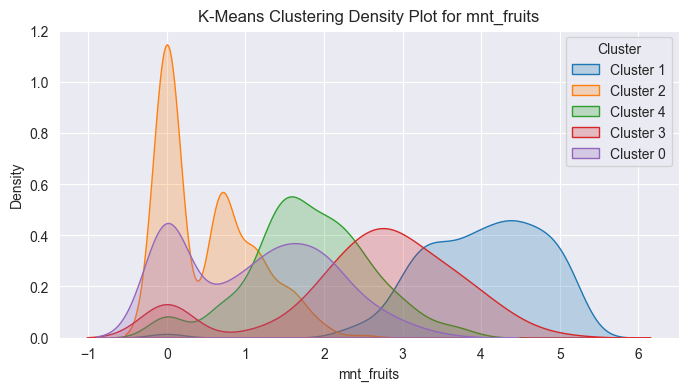

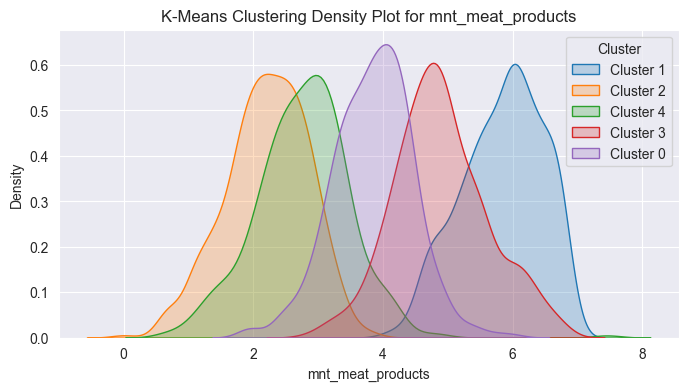

...

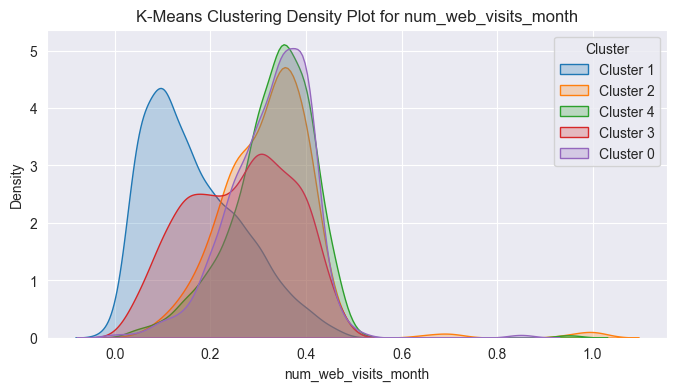

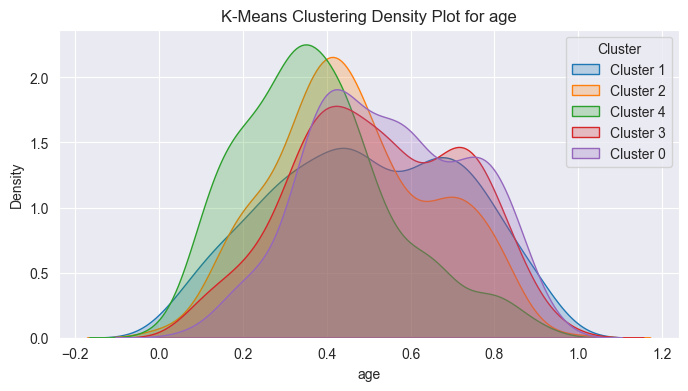

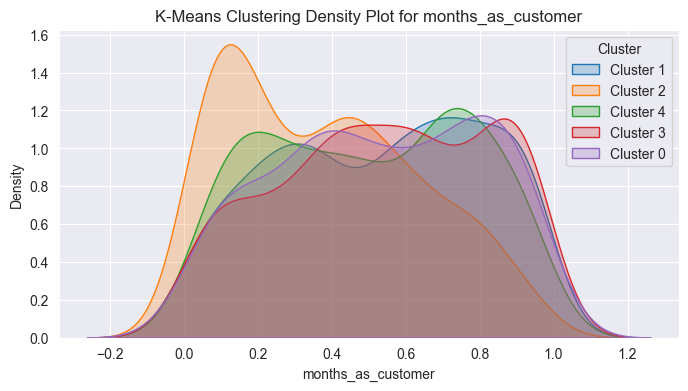

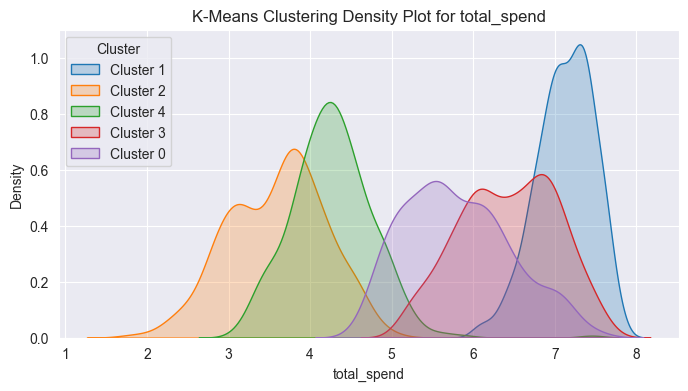

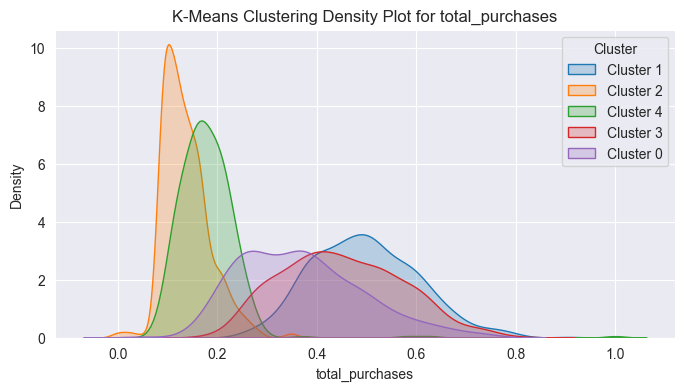

In [92]:
#Plot density plot for numerical features but with kmeans cluster color labels
def plot_kmeans_density(dataframe, cluster_column, title, col):
    
    plt.figure(figsize=(8, 4))
    for cluster in dataframe[cluster_column].unique():
        sns.kdeplot(data=dataframe[dataframe[cluster_column] == cluster], x=col, label=f'Cluster {cluster}', shade=True)
    
    plt.title(title)
    plt.xlabel(col)
    plt.legend(title='Cluster')
    
    plt.show()

for col in numerical_features:
    plot_kmeans_density(km_df, 'kmeans_cluster', f'K-Means Clustering Density Plot for {col}', col)

The above density plots show how the clustering affects the different features individually. This can help us understand the characteristics of each cluster and how they differ from one another. 

Overall, the customer segmentation is noticeable, but some overlaps do occur as well. 

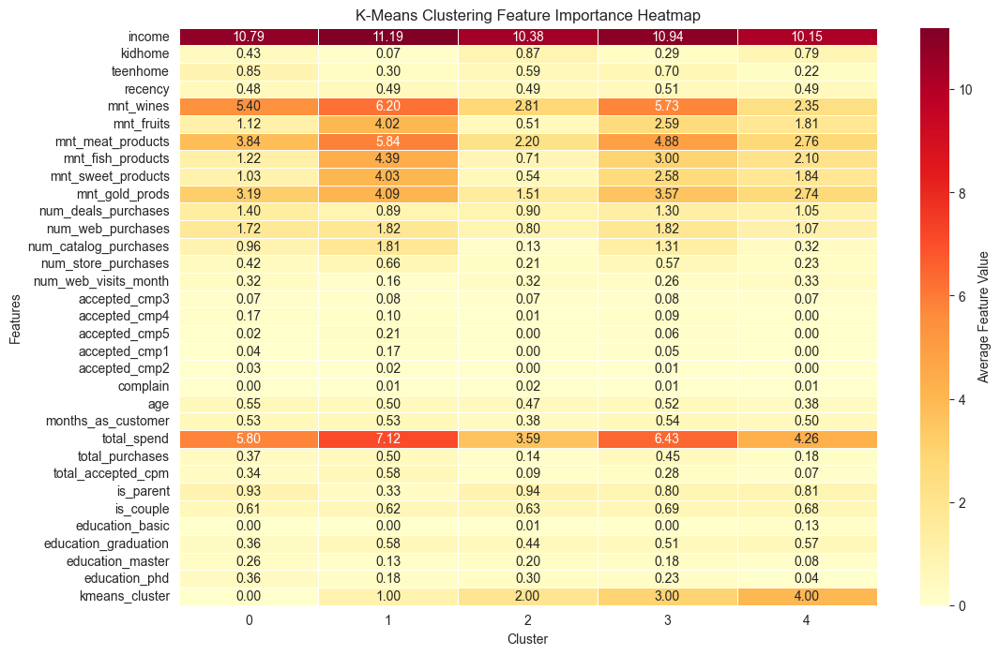

In [99]:
# Plotting a feature importance plot for the K-Means clustering
def plot_feature_importance(dataframe, labels, title):
    
    cluster_features = dataframe
    cluster_features['Cluster'] = labels
    cluster_means = cluster_features.groupby('Cluster').mean()

    plt.figure(figsize=(12, 8))
    sns.heatmap(cluster_means.T, cmap='YlOrRd', annot=True, fmt='.2f', 
                cbar_kws={'label': 'Average Feature Value'}, linewidths=0.5)
    plt.title(title)
    plt.xlabel('Cluster')
    plt.ylabel('Features')
    plt.xticks(rotation=0)
    plt.show()

plot_feature_importance(km_df, km_df['kmeans_cluster'], 'K-Means Clustering Feature Importance Heatmap')


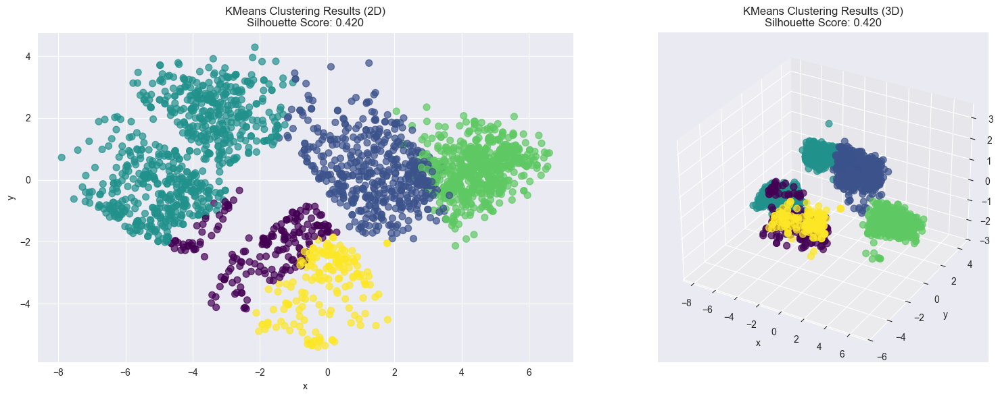

In [30]:
# Performing PCA for cluster visualization purposes
pca = PCA(n_components=3)
df_pca = pca.fit_transform(df_cluster)

def plot_kmeans(dataframe, optimal_k):
    
    fig = plt.figure(figsize=(24, 6))

    # Left plot: 2D Clustering Results
    kmeans = KMeans(n_clusters=optimal_k, random_state=0)
    kmeans.fit(dataframe)
    kmeans_results = kmeans.predict(dataframe)
    silhouette_score_value = silhouette_score(dataframe, kmeans_results)

    ax1 = fig.add_subplot(1, 3, 1)
    ax1.scatter(dataframe[:, 0], dataframe[:, 1], c=kmeans_results, cmap='viridis', s=50, alpha=0.7)
    ax1.set_xlabel('x')
    ax1.set_ylabel('y')
    ax1.set_title(f'KMeans Clustering Results (2D)\nSilhouette Score: {silhouette_score_value:.3f}')

    # Right plot: 3D Clustering Results
    ax2 = fig.add_subplot(1, 3, 2, projection='3d')
    ax2.scatter(dataframe[:, 0], dataframe[:, 1], dataframe[:, 2], c=kmeans_results, cmap='viridis', s=50, alpha=0.7)
    ax2.set_xlabel('x')
    ax2.set_ylabel('y')
    ax2.set_zlabel('z')
    ax2.set_title(f'KMeans Clustering Results (3D)\nSilhouette Score: {silhouette_score_value:.3f}')

    plt.tight_layout()
    plt.show()

# After looking at the elbow method, we pass the optimal number of clusters as a parameter
plot_kmeans(df_pca, 5)

### Hierarchical Clustering

Since the clustering is being used as part of EDA, we will not compare it with true labels, but rather focus on the clustering itself. This allows us to discover natural patterns.

Average linkage is a compromise between single and complete linkage. Due to the fact that we are not removing a significant amount of outliers, this options makes sense to balance sensitivity to them, as well as chaining. As such, we considered it an appropriate method to opt for in the upcoming hierarchical clustering.

To begin, finding the optimal threshold requires identifying the largest gap between consecutive distances in the dendrogram.


In [82]:
def find_optimal_threshold(Z):

    # Calculating the distances between clusters, and then finding the largest gap between consecutive distances
    distances = Z[:, 2]
    gaps = np.diff(distances)
    largest_gap = distances[np.argmax(gaps)]
    
    return largest_gap

In [83]:
def perform_clustering(data, method):
    
    Z = linkage(data, method=method)
    dist_threshold = find_optimal_threshold(Z)    
    clusters = cut_tree(Z, height=dist_threshold).flatten()
    
    return Z, clusters, dist_threshold

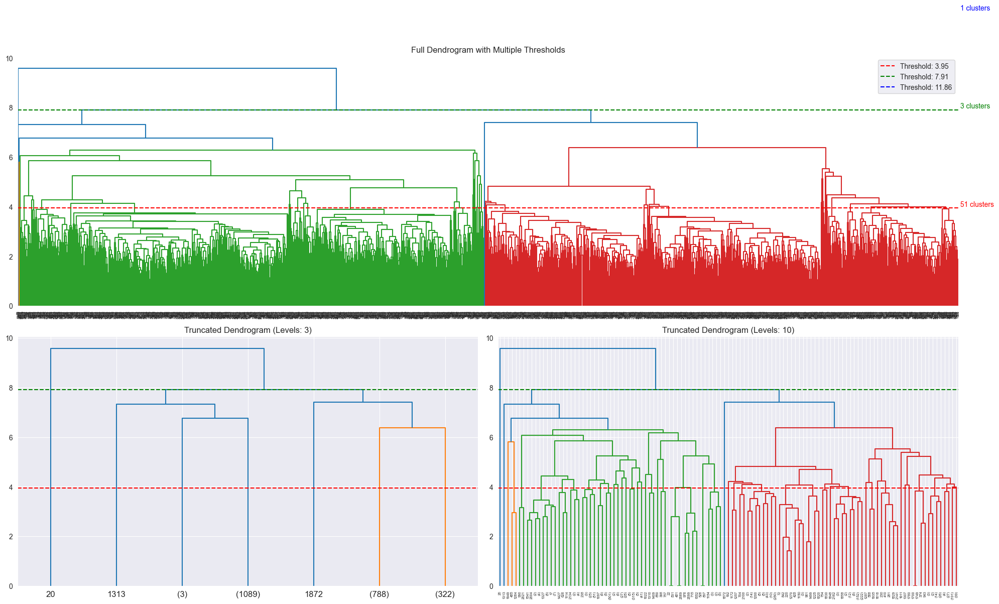

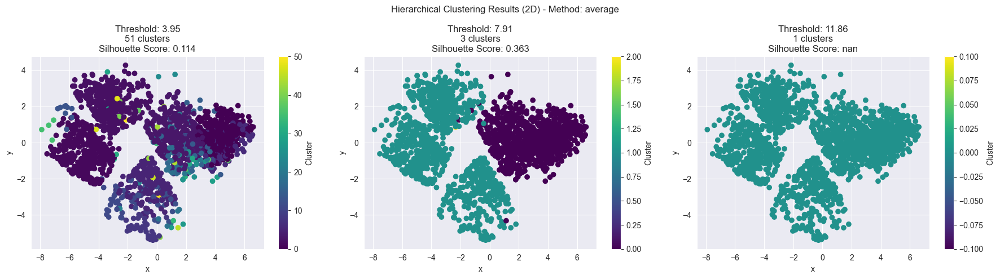

In [86]:
def plot_cluster_analysis(Z, thresholds):

    fig = plt.figure(figsize=(20, 12))
    
    # Plotting the full dendrogram with multiple thresholds
    ax1 = plt.subplot2grid((2, 2), (0, 0), colspan=2)
    dendrogram(Z, leaf_rotation=90)
    
    colours = ['r', 'g', 'b']
    for threshold, color in zip(thresholds, colours):
        ax1.axhline(y=threshold, color=color, linestyle='--', 
                   label=f'Threshold: {threshold:.2f}')
        
        clusters = cut_tree(Z, height=threshold).flatten()
        n_clusters = len(np.unique(clusters))
        ax1.text(ax1.get_xlim()[1], threshold, f' {n_clusters} clusters', 
                va='bottom', ha='left', color=color)
    
    ax1.set_title('Full Dendrogram with Multiple Thresholds')
    ax1.legend()
    
    # Plotting the truncated dendrograms at different levels 
    # This is to showcase how levels purely represent a viewing perspective
    for i, level in enumerate([3, 10]):
        ax = plt.subplot2grid((2, 2), (1, i))
        dendrogram(Z, truncate_mode='level', p=level)
        
        # Plotting the thresholds
        for threshold, color in zip(thresholds, colours):
            ax.axhline(y=threshold, color=color, linestyle='--')
        
        ax.set_title(f'Truncated Dendrogram (Levels: {level})')
    
    plt.tight_layout()
    plt.show()

# These plots are meant to show how different thresholds influence the number of clusters and what impact they have on the silhouette scores
def plot_threshold_effects(data, Z, thresholds, sil_scores, method):
    
    n_thresholds = len(thresholds)
    fig, axs = plt.subplots(1, n_thresholds, figsize=(6*n_thresholds, 5))
    
    for i, threshold in enumerate(thresholds):
        clusters = cut_tree(Z, height=threshold).flatten()
        n_clusters = len(np.unique(clusters))
        
        scatter = axs[i].scatter(data[:, 0], data[:, 1], c=clusters, cmap='viridis')
        axs[i].set_title(f'Threshold: {threshold:.2f}\n{n_clusters} clusters\nSilhouette Score: {sil_scores[i]:.3f}')
        axs[i].set_xlabel('x')
        axs[i].set_ylabel('y')
        plt.colorbar(scatter, ax=axs[i], label='Cluster')
    
    plt.suptitle(f'Hierarchical Clustering Results (2D) - Linkage Method: {method}')
    plt.tight_layout()
    plt.show()

def main_clustering_analysis(data, method='average'):

    Z, clusters, optimal_threshold = perform_clustering(data, method)
    
    # Comparison thresholds based on the optimal threshold
    thresholds = [optimal_threshold * 0.5, optimal_threshold, optimal_threshold * 1.5]
    
    sil_scores = []
    for threshold in thresholds:
        clusters = cut_tree(Z, height=threshold).flatten()
        n_clusters = len(np.unique(clusters))
        
        # It only makes sense to calculate the silhouette score IF there are multiple clusters
        if n_clusters > 1:
            sil_score = np.round(silhouette_score(data, clusters), 3)
            sil_scores.append(sil_score)
        else:
            sil_scores.append(np.nan)
    
    # Plotting visualizations (solely making use of PCA for 2D representation)
    pca = PCA(n_components=3)
    df_pca = pca.fit_transform(data)
    plot_cluster_analysis(Z, thresholds)
    plot_threshold_effects(df_pca, Z, thresholds, sil_scores, method)
    # Uncomment below to check how the cluster visualization would look without applying PCA
    #plot_threshold_effects(df_cluster.to_numpy(), Z, thresholds, sil_scores, method)
    
    return Z, thresholds

linkage_method = 'average'
Z, thresholds = main_clustering_analysis(df_cluster, linkage_method)

As is possible to see, the optimal threshold of 7.91 results in a silhouette score of 0.363. This is still not able to outperform the clustering conducted by the K-Means algorithm (0.420), making us consider it a better fit for customer segmentation purposes.

It is important to remember, however, that the silhouette score is not the only metric we should consider when evaluating clustering results. The number of clusters and the actual visual representation of the clusters are also important factors to consider. Only by considering all of them together can we make an informed decision on which clustering method ends up telling a more coherent story.

# Assocation rules

With association rules, frequent itemsets are found in the data. A frequent itemset, is a set of variables that has a high likelihood of being found together. An itemset is at least a two variables, but it can be much more. The likelihood of an itemset being found, is determined through the support support thresholds. There are two types of requirements or steps in assocation rules:
1. num_itemsets. How frequent a combination of an itemset to appear in the dataset, to be considered an itemset. This is important, because there might be an obsure itemset, with only a single instance that resulted in a purchase, so even though the likihood of purchase when seeing this itemset is 100%, the actual real world application is 0
- confidence of support threshold. This is the required confidence that an itemset must have to result in purchasing. So if variable A + B -> C. The support threshold determines how often the A + B, indeed was seen with a result in C. In other terms, if someone buys coffee(A) and sugar(B), in at least 80% of the cases he aslo buys coffee milk. the confidence in this scenario is threshold is set to 0.8. The assocation rule algorithm, only identifies the association rule, when the cofidence of the rule has at least the likelihood to occur in the data. 

Steps in the association rule Appropri dataset
1. Convert all variables that we would like to test for into a binary representation 

In [201]:
Q3 = np.quantile(df_normalized["recency"], 0.75)
np.quantile(df_normalized["recency"], 0.50)

0.494949494949495

In [202]:
def transform_df_into_interquartile_range_categories(df_to_transform):
    """
    it is assumed that the values in the df are already scaled, relating to its distribution.
    
    For each float column in columns_to_transform. They should become a dummy variable of the same column depending on where the cell is in the interquartile range of such a column
    
    For each float column in columns_to_transform, four new binary columns will be created 
    indicating which quartile range the value falls into:
    - '{col}_very_low': 1 if < Q1, else 0
    - '{col}_low': 1 if >= Q1 and < Q2, else 0
    - '{col}_high': 1 if >= Q2 and < Q3, else 0
    - '{col}_very_high': 1 if >= Q3, else 0
    
    :param df_to_transform: pandas DataFrame containing the columns to transform
    :return: transformed pandas DataFrame with new binary columns
    """
    df_local = df_to_transform.copy()
    
    columns_to_transform = ['income', 'recency', 'mnt_wines', 'mnt_fruits', 'mnt_meat_products', 'mnt_fish_products', 
                               'mnt_sweet_products', 'mnt_gold_prods', 'num_deals_purchases', 'num_web_purchases', 
                               'num_catalog_purchases', 'num_store_purchases', 'num_web_visits_month', 'age', 
                               'months_as_customer', 'total_spend', 'total_purchases']
    
    # For each column, calculate quartiles and create new binary columns
    for col in columns_to_transform:
        if col in df_local.columns:
            # Calculate quartiles
            q1 = df_local[col].quantile(0.25)
            q2 = df_local[col].quantile(0.50)  # median
            q3 = df_local[col].quantile(0.75)
            
            # Create four new binary columns for each quartile range
            df_local[f'{col}_very_low'] = (df_local[col] < q1).astype(int)
            df_local[f'{col}_low'] = ((df_local[col] >= q1) & (df_local[col] < q2)).astype(int)
            df_local[f'{col}_high'] = ((df_local[col] >= q2) & (df_local[col] < q3)).astype(int)
            df_local[f'{col}_very_high'] = (df_local[col] >= q3).astype(int)
            
            # Drop original numerical column
            df_local.drop(columns=[col], inplace=True)
    
    # create new dummy column, if multiple kids are at home using a onehot encoded variable
    df_local["multiplekidhome"] = df_local["kidhome"].apply(lambda x: 1 if x > 1 else 0)
    df_local["multipleteenhome"] = df_local["teenhome"].apply(lambda x: 1 if x > 1 else 0)
    
    # transforming kidhome and teenhome to be a binary column
    df_local["kidhome"] = df_local["kidhome"].apply(lambda x: 1 if x > 0 else 0)
    df_local["teenhome"] = df_local["teenhome"].apply(lambda x: 1 if x > 0 else 0)
    df_local = df_local.applymap(lambda x: 1 if x > 0 else 0)
    
    return df_local    
    

df_interquartile_transformed = transform_df_into_interquartile_range_categories(df_normalized)
df_interquartile_transformed

,kidhome,teenhome,accepted_cmp3,accepted_cmp4,accepted_cmp5,accepted_cmp1,accepted_cmp2,complain,response,total_accepted_cpm,is_parent,is_couple,education_basic,education_graduation,education_master,education_phd,income_very_low,income_low,income_high,income_very_high,recency_very_low,recency_low,recency_high,recency_very_high,mnt_wines_very_low,mnt_wines_low,mnt_wines_high,mnt_wines_very_high,mnt_fruits_very_low,mnt_fruits_low,mnt_fruits_high,mnt_fruits_very_high,mnt_meat_products_very_low,mnt_meat_products_low,mnt_meat_products_high,mnt_meat_products_very_high,mnt_fish_products_very_low,mnt_fish_products_low,mnt_fish_products_high,mnt_fish_products_very_high,mnt_sweet_products_very_low,mnt_sweet_products_low,mnt_sweet_products_high,mnt_sweet_products_very_high,mnt_gold_prods_very_low,mnt_gold_prods_low,mnt_gold_prods_high,mnt_gold_prods_very_high,num_deals_purchases_very_low,num_deals_purchases_low,num_deals_purchases_high,num_deals_purchases_very_high,num_web_purchases_very_low,num_web_purchases_low,num_web_purchases_high,num_web_purchases_very_high,num_catalog_purchases_very_low,num_catalog_purchases_low,num_catalog_purchases_high,num_catalog_purchases_very_high,num_store_purchases_very_low,num_store_purchases_low,num_store_purchases_high,num_store_purchases_very_high,num_web_visits_month_very_low,num_web_visits_month_low,num_web_visits_month_high,num_web_visits_month_very_high,age_very_low,age_low,age_high,age_very_high,months_as_customer_very_low,months_as_customer_low,months_as_customer_high,months_as_customer_very_high,total_spend_very_low,total_spend_low,total_spend_high,total_spend_very_high,total_purchases_very_low,total_purchases_low,total_purchases_high,total_purchases_very_high,multiplekidhome,multipleteenhome
0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0
1,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0
2236,1,1,0,0,0,1,0,0,0,1,1,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,1,0
2237,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0
2238,0,1,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,1,0,0


In [203]:
#running the fpgrowth algorithm
dataset = df_interquartile_transformed
item_sets = fpgrowth(dataset, min_support=0.05, use_colnames=True, max_len=7, verbose=False)
# printing top 10
item_sets

,support,itemsets
0,0.504762,(education_graduation)
1,0.372336,(num_web_visits_month_very_high)
2,0.363265,(num_store_purchases_low)
3,0.324717,(num_deals_purchases_very_high)
4,0.312018,(num_catalog_purchases_very_high)
...,...,...
27437,0.050340,"(mnt_sweet_products_very_low, num_deals_purcha..."
27438,0.050340,"(mnt_sweet_products_very_low, mnt_gold_prods_v..."
27439,0.074376,"(accepted_cmp4, total_accepted_cpm)"
27440,0.052608,"(accepted_cmp4, mnt_wines_very_high)"


We are most interested in conversion of a customer into a response. therefore we want to find the association rules with the variables and response

In [204]:
for index, item in item_sets.iterrows():
    for val in item["itemsets"]:
        if "response" in val:
            print("itemset nr = ", index)
            print("itemset = ",item["itemsets"])
            print("support itemset = ", item["support"])
            print()

itemset nr =  18
itemset =  frozenset({'response'})
support itemset =  0.1510204081632653

itemset nr =  3374
itemset =  frozenset({'num_catalog_purchases_very_high', 'response'})
support itemset =  0.07936507936507936

itemset nr =  3375
itemset =  frozenset({'response', 'total_spend_very_high'})
support itemset =  0.07573696145124717

itemset nr =  3376
itemset =  frozenset({'mnt_meat_products_very_high', 'response'})
support itemset =  0.06938775510204082

itemset nr =  3377
itemset =  frozenset({'months_as_customer_very_high', 'response'})
support itemset =  0.06893424036281179

itemset nr =  3378
itemset =  frozenset({'education_graduation', 'response'})
support itemset =  0.06893424036281179

itemset nr =  3379
itemset =  frozenset({'response', 'mnt_wines_very_high'})
support itemset =  0.06757369614512472

itemset nr =  3380
itemset =  frozenset({'response', 'num_web_visits_month_very_high'})
support itemset =  0.05986394557823129

itemset nr =  3381
itemset =  frozenset({'respo

### `todo:` are the things below used? @mehdigreefhorst SHOULD WE DELETE THE STUFF BELOW THIS MD?

In [205]:
# # Generate association rules with a minimum confidence level
# rules = association_rules(item_sets, metric="confidence", min_threshold=0.5, num_itemsets=len(item_sets))

# rules 

In [206]:
# # Order the most frequent item combinations in the entire dataset, by sorting the dataset by support, confidence, and lift
# rules_10 = rules.sort_values(["support", "confidence","lift"],axis = 0, ascending = False).head(10)
# rules_10

In [207]:
# # Create a bar plot for confidence values
# plt.figure(figsize=(10, 6))
# sns.barplot(x='confidence', y='antecedents', hue='consequents', data=rules, palette='viridis')

# # Add title and labels
# plt.title('Confidence of Association Rules', fontsize=14)
# plt.xlabel('Confidence', fontsize=12)
# plt.ylabel('Antecedents', fontsize=12)
# plt.legend(title='Consequents', bbox_to_anchor=(1.05, 1), loc='upper left')

# # Show plot
# plt.tight_layout()
# plt.show()

In [208]:
# #### Visualization of obtained rules
# plt.figure(figsize=(15, 6))
# sns.barplot(x="support", y="confidence", data=rules, palette='viridis')
# plt.title("support vs confidence")
# plt.show()

# plt.figure(figsize=(15, 6))
# plt.scatter(rules_10['support'], rules_10['confidence'])
# plt.xlabel('support')
# plt.ylabel('confidence')
# plt.show()


In [209]:
# # Write your code for Association rules with 15% Support and 30% confidence
# rules = association_rules(item_sets, metric='confidence', min_threshold=0.30,
#                           num_itemsets=len(item_sets))
# rules.head()

### `TODO`: PLEASE INTERPRET THESE RULES ACCORDIGN TO THE PDF!!!!!!!!

# Modeling

For the modeling part we first need to split the dataset into train and test datasets.

In [ ]:
X = df_normalized.drop(columns='response')
y = df_normalized['response']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

smote = SMOTE(random_state=0)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print("Class distribution before SMOTE (train):")
print(y_train.value_counts())
print("\nClass distribution after SMOTE (train):")
print(y_train_smote.value_counts())

Class distribution before SMOTE:
0    1508
1     256
Name: response, dtype: int64

Class distribution after SMOTE:
0    1508
1    1508
Name: response, dtype: int64


For our first model we will train a Logistic Regression model.

In [211]:
def create_logistic_regression_model():
    model = LogisticRegression(random_state=0)
    model.fit(X_train_smote, y_train_smote)
    y_pred = model.predict(X_test)
    return model, y_pred

lr_model, lr_y_pred = create_logistic_regression_model()

Next we will train a Random Forest Classifier model.

In [212]:
def create_random_forest_model():
    model = RandomForestClassifier(random_state=0)
    model.fit(X_train_smote, y_train_smote)
    y_pred = model.predict(X_test)
    return model, y_pred

rf_model, rf_y_pred = create_random_forest_model()

Next we will train an Artificial Neural Network model.

In [213]:
def create_ann_model():
    # Define the model architecture
    model = Sequential([
        Dense(64, input_shape=(X_train.shape[1],), activation='relu'),
        Dense(32, activation='relu'),
        Dense(1, activation='sigmoid')  # Output layer for binary classification
    ])

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

    # Train the model
    model.fit(X_train_smote, y_train_smote, epochs=20, batch_size=32, validation_split=0.1, verbose=1)

    # Predict on the test set and convert probabilities to binary values (0 or 1)
    y_pred_proba = model.predict(X_test)
    y_pred = (y_pred_proba > 0.5).astype(int).flatten()  # Convert probabilities to 0 or 1

    return model, y_pred

# Create and evaluate the ANN model
ann_model, ann_y_pred = create_ann_model()

Epoch 1/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5546 - loss: 0.6855 - val_accuracy: 0.7450 - val_loss: 0.4735
Epoch 2/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7486 - loss: 0.5079 - val_accuracy: 0.7318 - val_loss: 0.4882
Epoch 3/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.7897 - loss: 0.4397 - val_accuracy: 0.7947 - val_loss: 0.4498
Epoch 4/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8427 - loss: 0.3785 - val_accuracy: 0.9205 - val_loss: 0.2530
Epoch 5/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8425 - loss: 0.3542 - val_accuracy: 0.9007 - val_loss: 0.2709
Epoch 6/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8531 - loss: 0.3264 - val_accuracy: 0.9570 - val_loss: 0.1798
Epoch 7/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8643 - loss: 0.3254 - val_accuracy: 0.8808 - val_loss: 0.2621
Epoch 8/20
85/85 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8697 - loss: 0.2957 - val_accuracy: 0.9503 - val_loss:

Lets evaluate all the models.

Evaluation for Logistic Regression:
    Accuracy: 0.85
    Precision: 0.57
    Recall: 0.66
    F1 Score: 0.61
    ROC-AUC: 0.78



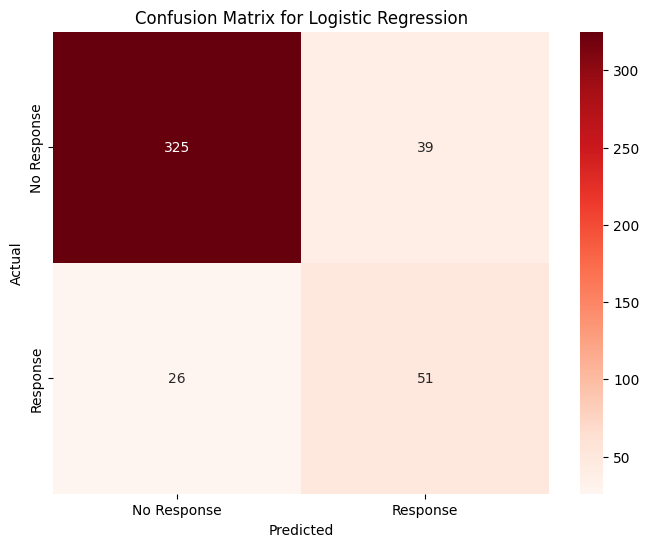

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.93      0.89      0.91       364
           1       0.57      0.66      0.61        77

    accuracy                           0.85       441
   macro avg       0.75      0.78      0.76       441
weighted avg       0.86      0.85      0.86       441


Evaluation for Random Forest:
    Accuracy: 0.87
    Precision: 0.67
    Recall: 0.53
    F1 Score: 0.59
    ROC-AUC: 0.74



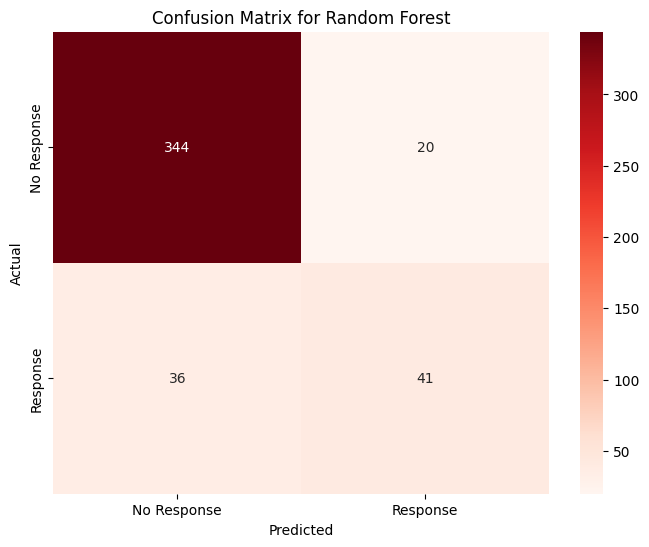

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.91      0.95      0.92       364
           1       0.67      0.53      0.59        77

    accuracy                           0.87       441
   macro avg       0.79      0.74      0.76       441
weighted avg       0.86      0.87      0.87       441


Evaluation for Artificial Neural Network:
    Accuracy: 0.86
    Precision: 0.61
    Recall: 0.52
    F1 Score: 0.56
    ROC-AUC: 0.72



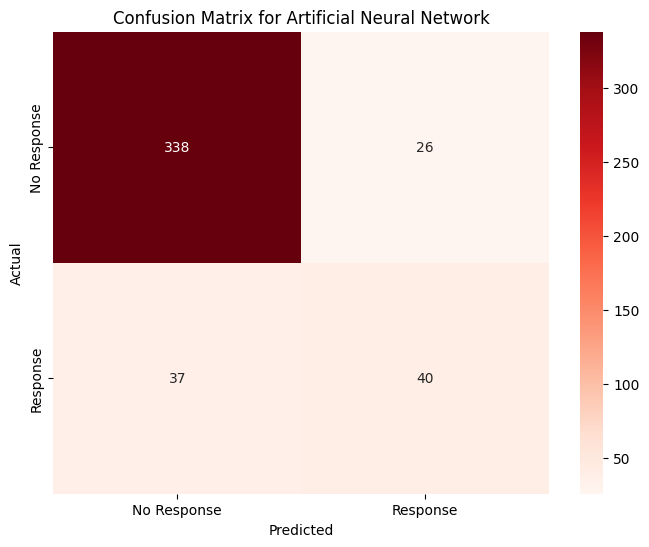

Classification Report for Artificial Neural Network:
              precision    recall  f1-score   support

           0       0.90      0.93      0.91       364
           1       0.61      0.52      0.56        77

    accuracy                           0.86       441
   macro avg       0.75      0.72      0.74       441
weighted avg       0.85      0.86      0.85       441




In [214]:
def evaluate_model(y_test, y_pred, model_name="Model"):
    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_pred)

    # Print metrics
    print(f"Evaluation for {model_name}:")
    print(f"    Accuracy: {accuracy:.2f}")
    print(f"    Precision: {precision:.2f}")
    print(f"    Recall: {recall:.2f}")
    print(f"    F1 Score: {f1:.2f}")
    print(f"    ROC-AUC: {roc_auc:.2f}\n")

    # Confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)     
    # Plot the confusion matrix as a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Reds', xticklabels=['No Response', 'Response'], yticklabels=['No Response', 'Response'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

    # Classification report for detailed performance metrics
    print(f'Classification Report for {model_name}:')
    print(classification_report(y_test, y_pred))
    print('====================================================================================================================================\n')

evaluate_model(y_test, lr_y_pred, model_name="Logistic Regression")
evaluate_model(y_test, rf_y_pred, model_name="Random Forest")
evaluate_model(y_test, ann_y_pred, model_name="Artificial Neural Network")

The function below performs 5-fold cross-validation on a given model, calculating the mean F1 score to assess performance. The F1 score is chosen for this business problem because it balances precision and recall, making it ideal for predicting customer responses to marketing campaigns where both false positives (targeting non-responders) and false negatives (missing potential responders) are costly. By focusing on F1, we ensure that our model captures as many true responders as possible while minimizing unnecessary outreach, allowing us to select the model that best balances engagement and resource efficiency.

In [215]:
def cross_validate_model(model, model_name):
    if model_name == "Artificial Neural Network":
        # Wrap the ANN model for use with scikit-learn
        ann_keras = KerasClassifier(build_fn=model, epochs=20, batch_size=32, verbose=0) 
        # Perform cross-validation with the ANN model
        mean_f1_score = cross_val_score(ann_keras, X_train, y_train, cv=5, scoring='f1').mean()
        print(f"Artificial Neural Network Mean F1 Score: {mean_f1_score:.2f}")   
    else:
        f1_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='f1')
        mean_f1_score = f1_scores.mean()
        print(f"{model_name} Mean F1 Score: {mean_f1_score:.2f}")
    return mean_f1_score

lr_f1_score = cross_validate_model(lr_model, "Logistic Regression")
rf_f1_score = cross_validate_model(rf_model, "Random Forest")
ann_f1_score = cross_validate_model(ann_model, "Artificial Neural Network")

Logistic Regression Mean F1 Score: 0.56
Random Forest Mean F1 Score: 0.48
Artificial Neural Network Mean F1 Score: 0.61


## Parameter Tuning 

Based on the best performing model we will tune the hyperparameters.

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best Parameters: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Best Mean F1 Score: 0.8608918457449436
Evaluation for Tuned Logistic Regression:
    Accuracy: 0.86
    Precision: 0.57
    Recall: 0.71
    F1 Score: 0.64
    ROC-AUC: 0.80



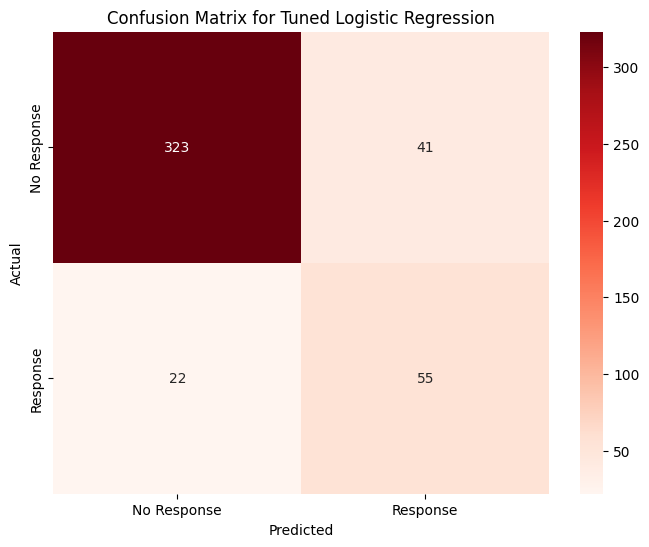

Classification Report for Tuned Logistic Regression:
              precision    recall  f1-score   support

           0       0.94      0.89      0.91       364
           1       0.57      0.71      0.64        77

    accuracy                           0.86       441
   macro avg       0.75      0.80      0.77       441
weighted avg       0.87      0.86      0.86       441




In [216]:
def parameter_tuning_for_lr():
    param_grid = {
        'C': [0.01, 0.1, 1, 10, 100],              # Regularization strength
        'penalty': ['l2', 'l1'],                   # Regularization type
        'solver': ['liblinear', 'saga'],           # Solver options
    }

    grid_search = GridSearchCV(estimator=lr_model, param_grid=param_grid, cv=5, scoring='f1', n_jobs=-1, verbose=1)
    grid_search.fit(X_train_smote, y_train_smote)

    print("Best Parameters:", grid_search.best_params_)
    print("Best Mean F1 Score:", grid_search.best_score_)

    return grid_search.best_estimator_

tuned_lr_model = parameter_tuning_for_lr()

y_pred = tuned_lr_model.predict(X_test)

# Evaluate the tuned model
evaluate_model(y_test, y_pred, model_name="Tuned Logistic Regression")

### `TODO`: COMPARE THE RESULTS OF THE THREE MODELS **WITH** HYPERPARAMETER TUNING

## Evaluation